In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from IPython.display import Image
from ast import literal_eval

pd.set_option("display.max_rows", None)

In [2]:
movie_df = pd.read_csv('../data/movie_database.csv')
channel_a_schedule_df = pd.read_csv('../data/channel_A_schedule.csv')
channel_0_conversion_rates_df = pd.read_csv('../data/channel_0_conversion_rates.csv')
channel_1_conversion_rates_df = pd.read_csv('../data/channel_1_conversion_rates.csv')
channel_2_conversion_rates_df = pd.read_csv('../data/channel_2_conversion_rates.csv')
channel_0_schedule_df = pd.read_csv('../data/channel_0_schedule.csv')
channel_1_schedule_df = pd.read_csv('../data/channel_1_schedule.csv')
channel_2_schedule_df = pd.read_csv('../data/channel_2_schedule.csv')

In [3]:
movie_df['genres'] = movie_df['genres'].apply(literal_eval)
movie_df['release_date'] = pd.to_datetime(movie_df['release_date'])

## Movie Database

In [4]:
movie_df.describe()

,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,n_ad_breaks,runtime_with_ads,scaled_popularity,children_scaled_popularity,adults_scaled_popularity,retirees_scaled_popularity
count,5920.000000,5920.000000,5920,5.920000e+03,5920.000000,5.920000e+03,5920.000000,5920.000000,5920.000000,5920.000000,5.920000e+03,5.920000e+03,5.920000e+03
mean,6.469737,2392.113514,2001-09-08 06:20:25.945945856,1.045572e+08,109.247635,3.605032e+07,27.371036,4.179392,128.584459,0.462636,3.142599e-01,4.362238e-01,3.392472e-01
min,1.840000,51.000000,1950-02-22 00:00:00,1.007962e+06,25.000000,8.000000e+00,0.781000,1.000000,30.000000,0.000001,4.000000e-07,4.000000e-07,4.000000e-07
25%,5.973000,391.000000,1993-06-02 06:00:00,1.249611e+07,96.000000,9.000000e+06,12.868000,4.000000,120.000000,0.315709,1.660242e-01,2.919421e-01,2.252241e-01
50%,6.497500,1090.000000,2004-08-23 12:00:00,3.851700e+07,106.000000,2.000000e+07,17.631000,4.000000,120.000000,0.448190,2.723963e-01,4.172351e-01,3.262054e-01
75%,7.014250,2790.000000,2013-01-03 00:00:00,1.115036e+08,119.000000,4.500000e+07,26.452750,4.000000,150.000000,0.603607,4.230471e-01,5.682126e-01,4.376017e-01
max,8.707000,34495.000000,2023-09-26 00:00:00,2.923706e+09,254.000000,4.600000e+08,2994.357000,9.000000,300.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
std,0.794488,3558.743603,NaN,1.903581e+08,19.515802,4.398495e+07,78.465172,0.695542,24.467769,0.221364,2.016630e-01,2.149646e-01,1.697512e-01


### Rating

In [5]:
movie_df.head()

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,runtime_with_ads,scaled_popularity,children_scaled_popularity,adults_scaled_popularity,retirees_scaled_popularity
0,Inception,8.364,34495,2010-07-15,825532764,148,160000000,83.952,"[Action, Science Fiction, Adventure]",5,180.0,0.972027,0.777622,0.972027,0.388811
1,Interstellar,8.417,32571,2014-11-05,701729206,169,165000000,140.241,"[Adventure, Drama, Science Fiction]",6,210.0,1.000000,0.600000,1.000000,0.600000
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,185000000,130.643,"[Drama, Action, Crime, Thriller]",6,180.0,1.000000,0.600000,1.000000,0.800000
3,Avatar,7.573,29815,2009-12-15,2923706026,162,237000000,79.932,"[Action, Adventure, Fantasy, Science Fiction]",6,180.0,0.958199,0.766559,0.958199,0.383280
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,220000000,98.082,"[Science Fiction, Action, Adventure]",5,180.0,1.000000,0.800000,1.000000,0.400000


In [6]:
movie_df.loc[movie_df['title'] == 'Bee Movie']

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,runtime_with_ads,scaled_popularity,children_scaled_popularity,adults_scaled_popularity,retirees_scaled_popularity
893,Bee Movie,6.016,4500,2007-10-28,287594577,91,150000000,34.085,"[Family, Animation, Adventure, Comedy]",4,120.0,0.693048,0.693048,0.415829,0.415829


![title](../data/goat.jpg)


#### GOAT

In [7]:
movie_df.loc[movie_df['title'] == '2001: A Space Odyssey']

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,runtime_with_ads,scaled_popularity,children_scaled_popularity,adults_scaled_popularity,retirees_scaled_popularity
237,2001: A Space Odyssey,8.076,10575,1968-04-02,71923560,149,12000000,48.932,"[Science Fiction, Mystery, Adventure]",5,180.0,0.811702,0.487021,0.811702,0.487021


In [8]:
movie_df.columns

Index(['title', 'vote_average', 'vote_count', 'release_date', 'revenue',
       'runtime', 'budget', 'popularity', 'genres', 'n_ad_breaks',
       'runtime_with_ads', 'scaled_popularity', 'children_scaled_popularity',
       'adults_scaled_popularity', 'retirees_scaled_popularity'],
      dtype='object')

In [9]:
movie_df.loc[:, ['title', 'vote_average']].sort_values(by='vote_average', ascending=False).head()

,title,vote_average
53,The Godfather,8.707
14,The Shawshank Redemption,8.702
211,The Godfather Part II,8.591
116,Schindler's List,8.573
2,The Dark Knight,8.512


In [10]:
movie_df.loc[:, ['title', 'vote_average']].sort_values(by='vote_average', ascending=False).tail()

,title,vote_average
5616,Pledge This!,3.025
5507,Lawnmower Man 2: Beyond Cyberspace,2.909
2000,Dragonball Evolution,2.890
5884,Leonard Part 6,2.661
5733,Saving Christmas,1.840


array([[<Axes: title={'center': 'vote_average'}>]], dtype=object)

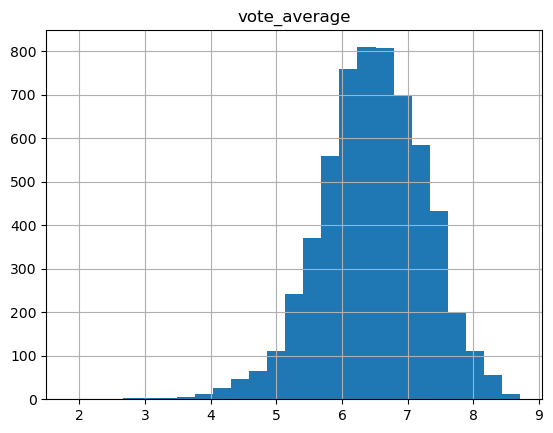

In [11]:
movie_df.loc[:, ['vote_average']].hist(bins=25)

Average about 6.5, relatively Gaussian

array([[<Axes: title={'center': 'vote_count'}>]], dtype=object)

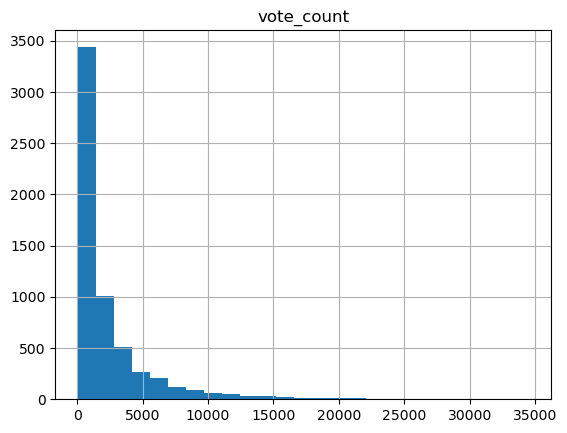

In [12]:
movie_df.loc[:, ['vote_count']].hist(bins=25)

Text(0, 0.5, 'vote_average')

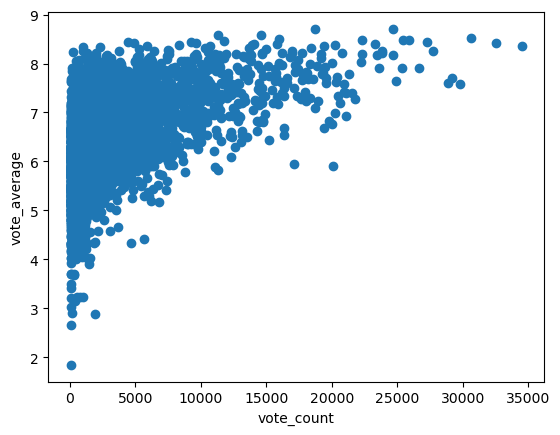

In [13]:
plt.scatter(movie_df.loc[:, ['vote_count']], movie_df.loc[:, ['vote_average']])
plt.xlabel('vote_count')
plt.ylabel('vote_average')

Vote count and rating are dependent; movie that receive large amount of votes gets a high vote.

### release_date	

In [14]:
movie_df['release_date'].head()

0   2010-07-15
1   2014-11-05
2   2008-07-16
3   2009-12-15
4   2012-04-25
Name: release_date, dtype: datetime64[ns]

In [15]:
movie_df['release_year'] = pd.to_datetime(movie_df['release_date']).dt.year

In [16]:
year_movie = movie_df.groupby(['release_year'])['title'].count().reset_index()

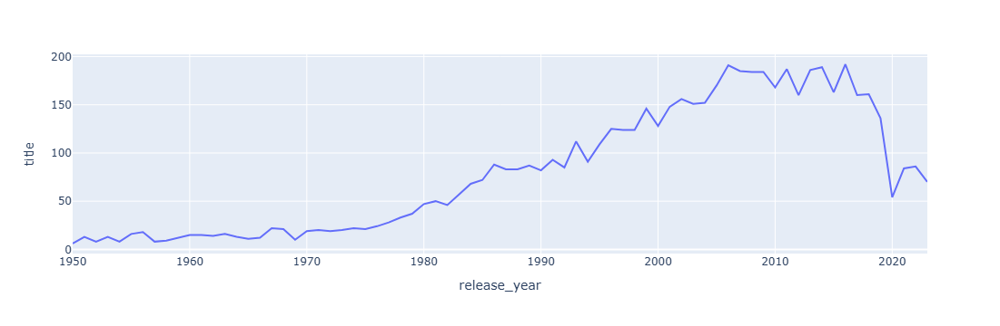

In [17]:
px.line(year_movie, x='release_year', y="title")

In [18]:
movie_df.loc[:, ['title', 'release_date']].sort_values(by='release_date', ascending=False).head()

,title,release_date
5886,Saw X,2023-09-26
5720,Expend4bles,2023-09-15
4060,A Haunting in Venice,2023-09-13
5794,After Everything,2023-09-13
4525,The Nun II,2023-09-06


### Revenue

In [19]:
movie_df.loc[:, ['title', 'revenue']].sort_values(by='revenue', ascending=False).head()

,title,revenue
3,Avatar,2923706026
15,Avengers: Endgame,2800000000
275,Avatar: The Way of Water,2320250281
17,Titanic,2264162353
56,Star Wars: The Force Awakens,2068223624


array([[<Axes: title={'center': 'revenue'}>]], dtype=object)

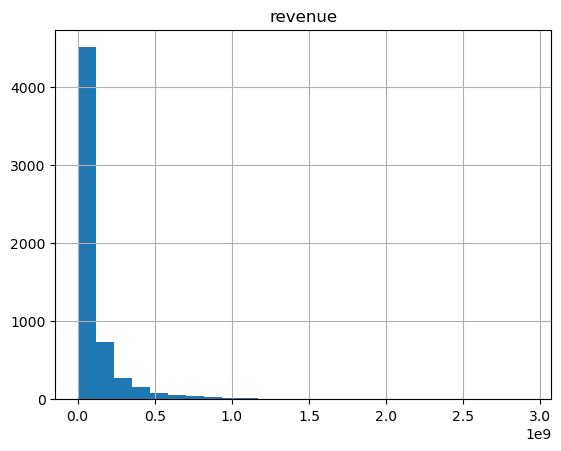

In [20]:
movie_df.loc[:, ['revenue']].hist(bins=25)

Text(0, 0.5, 'rating')

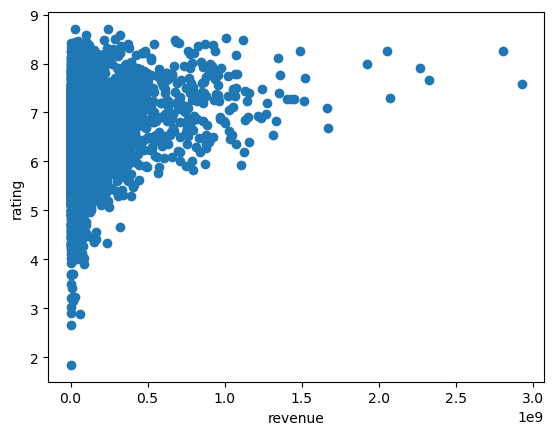

In [21]:
plt.scatter(movie_df.loc[:, ['revenue']], movie_df.loc[:, ['vote_average']])
plt.xlabel('revenue')
plt.ylabel('rating')

Text(0, 0.5, 'vote_count')

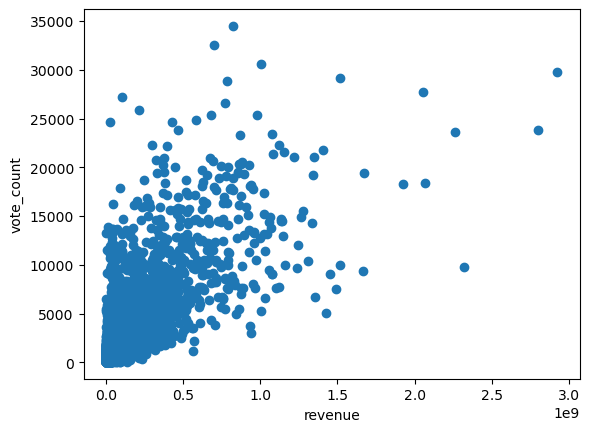

In [22]:
plt.scatter(movie_df.loc[:, ['revenue']], movie_df.loc[:, ['vote_count']])
plt.xlabel('revenue')
plt.ylabel('vote_count')

### Popularity

In [23]:
movie_df.loc[:, ['title', 'popularity']].sort_values(by='popularity', ascending=False).head()

,title,popularity
3053,Blue Beetle,2994.357
3620,Gran Turismo,2680.593
4525,The Nun II,1692.778
1901,Meg 2: The Trench,1567.273
4919,Retribution,1547.220


Text(0, 0.5, 'popularity')

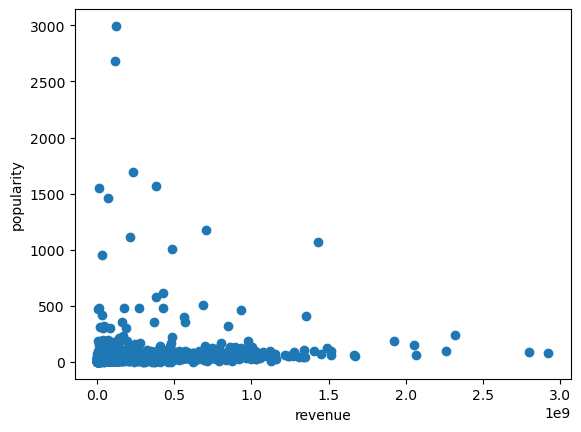

In [24]:
plt.scatter(movie_df.loc[:, ['revenue']], movie_df.loc[:, ['popularity']])
plt.xlabel('revenue')
plt.ylabel('popularity')

Text(0, 0.5, 'popularity')

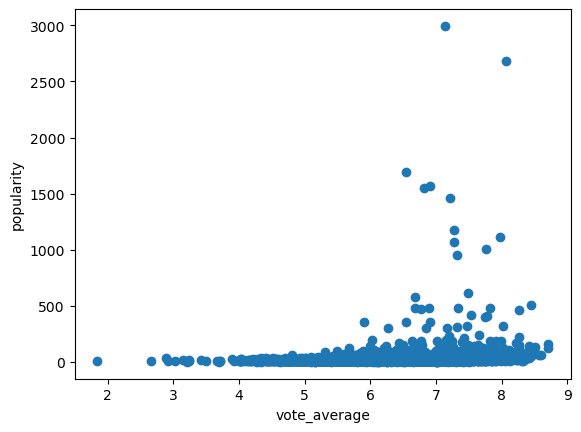

In [25]:
plt.scatter(movie_df.loc[:, ['vote_average']], movie_df.loc[:, ['popularity']])
plt.xlabel('vote_average')
plt.ylabel('popularity')

In [26]:
movie_df.loc[:, ['title', 'popularity']].sort_values(by='popularity', ascending=False).head(20)

,title,popularity
3053,Blue Beetle,2994.357
3620,Gran Turismo,2680.593
4525,The Nun II,1692.778
1901,Meg 2: The Trench,1567.273
4919,Retribution,1547.220
3138,Talk to Me,1458.514
1052,Fast X,1175.267
4101,Sound of Freedom,1111.036
790,Barbie,1069.340
1639,Elemental,1008.942


### Runtime

In [27]:
movie_df.loc[:, ['title', 'runtime']].sort_values(by='runtime', ascending=False).head()

,title,runtime
4887,Gettysburg,254
3725,Cleopatra,248
826,Once Upon a Time in America,229
1528,Lawrence of Arabia,228
5013,Woodstock,225


In [28]:
(movie_df['runtime'] / movie_df['n_ad_breaks']).mean()

26.18490655834406

### Genre

#### Post Process the genre

In [29]:
def dummify_genre(movie_df):
    genre_group_list = movie_df['genres'].to_list()
    genre_list = [genre for genre_group in genre_group_list for genre in genre_group]
    unique_genre_list = list(set(genre_list))
    def process_genre(current_genre_list):
        dummy_list = np.zeros(len(unique_genre_list)).tolist()
        pos = 0
        for genre in unique_genre_list:
            for current_genre in current_genre_list:
                if current_genre == genre:
                    dummy_list[pos] = 1
            pos = pos + 1
        return dummy_list
    dummy_genre = movie_df['genres'].apply(process_genre).to_list()
    genre_df = pd.DataFrame(columns=unique_genre_list, data=dummy_genre)
    return genre_df

In [30]:
genre_df = dummify_genre(movie_df)

### Visualization of Genre

In [31]:
genre_df.columns

Index(['Adventure', 'Mystery', 'History', 'Western', 'Thriller', 'Action',
       'Documentary', 'Music', 'Family', 'TV Movie', 'Drama', 'Horror',
       'Animation', 'Science Fiction', 'Romance', 'Comedy', 'Fantasy', 'War',
       'Crime'],
      dtype='object')

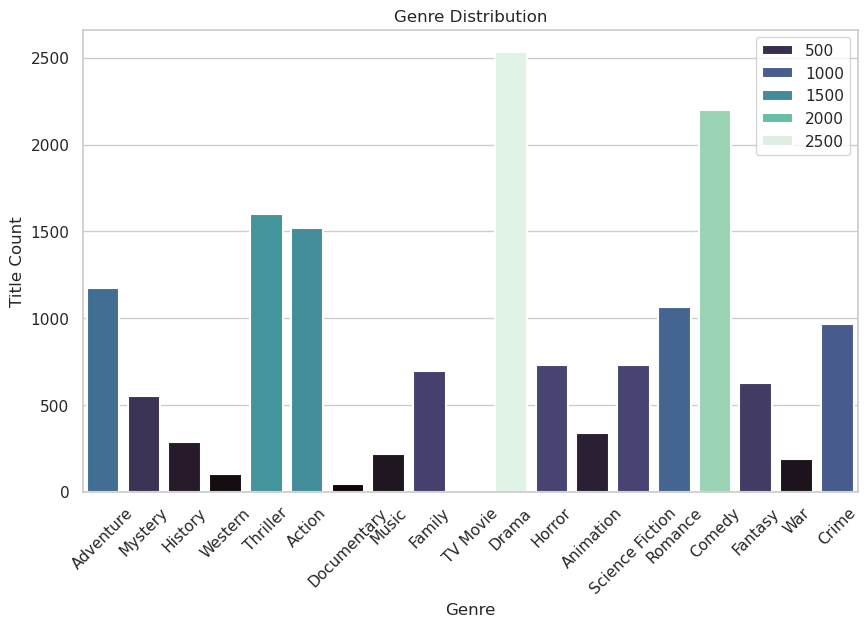

In [32]:
# Set the color palette to 'Spectral' or another suitable palette
sns.set(style="whitegrid")
sns.set_palette("Set3")  # This will provide varying colors

# Create the bar plot with customizations
plt.figure(figsize=(10, 6))
sns.barplot(x=genre_df.columns, y=genre_df.sum().to_list(), palette="mako", hue=genre_df.sum().to_list(), linewidth=1.5)

# Customize the plot
plt.xticks(rotation=45)
plt.xlabel('Genre')
plt.ylabel('Title Count')
plt.title('Genre Distribution')

plt.show()

In [33]:
genre_total_watch = genre_df.mul(movie_df['popularity'], axis=0).sum()
genre_avg_popularity = genre_total_watch/ genre_df.sum()

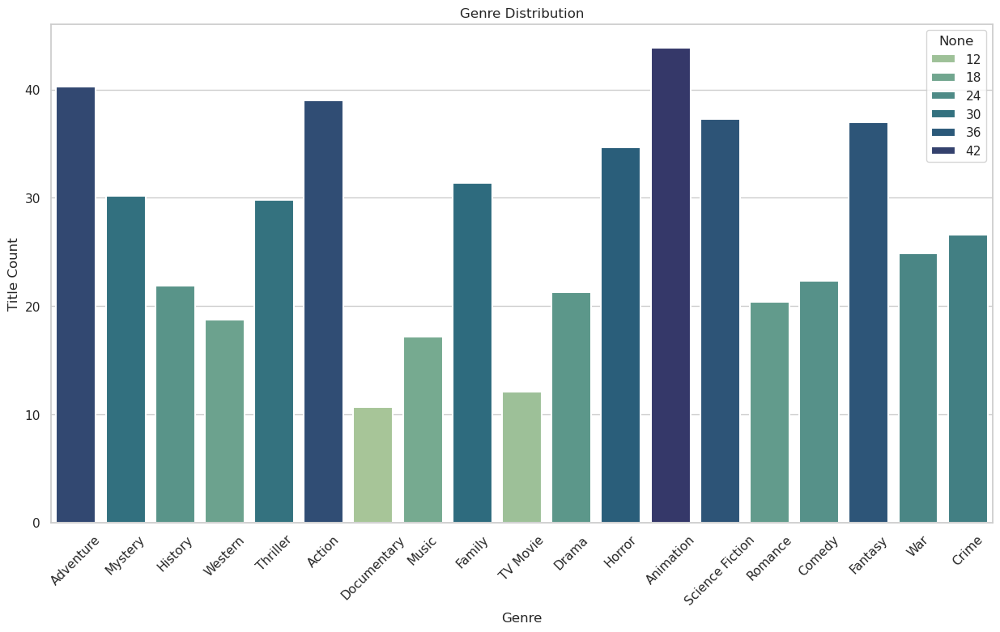

In [34]:
# Set the color palette
sns.set(style="whitegrid", color_codes=True)

# Create the bar plot with customizations
plt.figure(figsize=(15, 8))
sns.barplot(x=genre_df.columns, y=genre_avg_popularity, palette="crest", hue=genre_avg_popularity, linewidth=1.5)

# Customize the plot
plt.xticks(rotation=45)
plt.xlabel('Genre')
plt.ylabel('Title Count')
plt.title('Genre Distribution')

plt.show()

### Calculate each genre affinity with demographics 

In [35]:
genre_total_watch.head()

Adventure    47379.467
Mystery      16692.481
History       6244.519
Western       1908.801
Thriller     47609.946
dtype: float64

In [36]:
X = genre_df.mul(movie_df['scaled_popularity'], axis=0)
y = movie_df['children_scaled_popularity']
model = sm.OLS(y,X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     OLS Regression Results                                    
===============================================================================================
Dep. Variable:     children_scaled_popularity   R-squared (uncentered):                   0.904
Model:                                    OLS   Adj. R-squared (uncentered):              0.904
Method:                         Least Squares   F-statistic:                              2931.
Date:                        Fri, 08 Nov 2024   Prob (F-statistic):                        0.00
Time:                                15:10:43   Log-Likelihood:                          4373.8
No. Observations:                        5920   AIC:                                     -8710.
Df Residuals:                            5901   BIC:                                     -8582.
Df Model:                                  19                                                  
Covariance Type:                    nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Adventure           0.2482      0.008     32.045      0.000       0.233       0.263
Mystery             0.0715      0.011      6.623      0.000       0.050       0.093
History             0.0769      0.016      4.756      0.000       0.045       0.109
Western             0.1434      0.025      5.673      0.000       0.094       0.193
Thriller            0.1176      0.007     15.971      0.000       0.103       0.132
Action              0.3639      0.007     50.101      0.000       0.350       0.378
Documentary         0.3543      0.067      5.291      0.000       0.223       0.486
Music               0.2670      0.019     13.756      0.000       0.229       0.305
Family              0.1831      0.012     14.772      0.000       0.159       0.207
TV Movie            0.1095      0.196      0.559      0.576      -0.274       0.493
Drama               0.2155      0.006     34.380      0.000       0.203       0.228
Horror              0.2218      0.009     24.862      0.000       0.204       0.239
Animation           0.1237      0.014      8.769      0.000       0.096       0.151
Science Fiction     0.0952      0.009     11.080      0.000       0.078       0.112
Romance             0.0894      0.009      9.732      0.000       0.071       0.107
Comedy              0.5003      0.006     79.178      0.000       0.488       0.513
Fantasy             0.2488      0.009     28.394      0.000       0.232       0.266
War                 0.0423      0.018      2.363      0.018       0.007       0.077
Crime               0.0736      0.009      8.310      0.000       0.056       0.091
==============================================================================
Omnibus:                      597.388   Durbin-Watson:                   1.856
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4657.335
Skew:                           0.109   Prob(JB):                         0.00
Kurtosis:                       7.340   Cond. No.                         58.3
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [37]:
X = genre_df.mul(movie_df['scaled_popularity'], axis=0)
y = movie_df['adults_scaled_popularity']
model = sm.OLS(y,X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                    OLS Regression Results                                   
=============================================================================================
Dep. Variable:     adults_scaled_popularity   R-squared (uncentered):                   0.910
Model:                                  OLS   Adj. R-squared (uncentered):              0.910
Method:                       Least Squares   F-statistic:                              3139.
Date:                      Fri, 08 Nov 2024   Prob (F-statistic):                        0.00
Time:                              15:10:43   Log-Likelihood:                          2994.2
No. Observations:                      5920   AIC:                                     -5950.
Df Residuals:                          5901   BIC:                                     -5823.
Df Model:                                19                                                  
Covariance Type:                  nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Adventure           0.2342      0.010     23.955      0.000       0.215       0.253
Mystery             0.1950      0.014     14.312      0.000       0.168       0.222
History             0.2365      0.020     11.593      0.000       0.197       0.277
Western             0.1101      0.032      3.450      0.001       0.048       0.173
Thriller            0.2878      0.009     30.955      0.000       0.270       0.306
Action              0.3417      0.009     37.265      0.000       0.324       0.360
Documentary         0.3037      0.085      3.593      0.000       0.138       0.469
Music               0.0291      0.024      1.188      0.235      -0.019       0.077
Family             -0.0217      0.016     -1.386      0.166      -0.052       0.009
TV Movie            0.0020      0.247      0.008      0.994      -0.482       0.486
Drama               0.4975      0.008     62.886      0.000       0.482       0.513
Horror              0.5401      0.011     47.967      0.000       0.518       0.562
Animation          -0.0033      0.018     -0.183      0.854      -0.038       0.032
Science Fiction     0.2812      0.011     25.929      0.000       0.260       0.302
Romance             0.2685      0.012     23.151      0.000       0.246       0.291
Comedy              0.4943      0.008     61.977      0.000       0.479       0.510
Fantasy             0.2516      0.011     22.740      0.000       0.230       0.273
War                -0.0367      0.023     -1.621      0.105      -0.081       0.008
Crime               0.2553      0.011     22.834      0.000       0.233       0.277
==============================================================================
Omnibus:                      272.783   Durbin-Watson:                   1.846
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              771.584
Skew:                          -0.202   Prob(JB):                    2.84e-168
Kurtosis:                       4.722   Cond. No.                         58.3
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [38]:
X = genre_df.mul(movie_df['scaled_popularity'], axis=0)
y = movie_df['retirees_scaled_popularity']
model = sm.OLS(y,X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     OLS Regression Results                                    
===============================================================================================
Dep. Variable:     retirees_scaled_popularity   R-squared (uncentered):                   0.900
Model:                                    OLS   Adj. R-squared (uncentered):              0.900
Method:                         Least Squares   F-statistic:                              2810.
Date:                        Fri, 08 Nov 2024   Prob (F-statistic):                        0.00
Time:                                15:10:43   Log-Likelihood:                          4167.8
No. Observations:                        5920   AIC:                                     -8298.
Df Residuals:                            5901   BIC:                                     -8171.
Df Model:                                  19                                                  
Covariance Type:                    nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Adventure           0.0630      0.008      7.857      0.000       0.047       0.079
Mystery             0.2552      0.011     22.836      0.000       0.233       0.277
History             0.2406      0.017     14.377      0.000       0.208       0.273
Western             0.4076      0.026     15.575      0.000       0.356       0.459
Thriller            0.0935      0.008     12.257      0.000       0.079       0.108
Action              0.1417      0.008     18.843      0.000       0.127       0.156
Documentary         0.7132      0.069     10.287      0.000       0.577       0.849
Music               0.1949      0.020      9.698      0.000       0.155       0.234
Family              0.1258      0.013      9.806      0.000       0.101       0.151
TV Movie            0.1118      0.203      0.552      0.581      -0.285       0.509
Drama               0.5056      0.006     77.911      0.000       0.493       0.518
Horror              0.2411      0.009     26.108      0.000       0.223       0.259
Animation          -0.0208      0.015     -1.427      0.154      -0.049       0.008
Science Fiction     0.1077      0.009     12.104      0.000       0.090       0.125
Romance             0.2662      0.010     27.981      0.000       0.248       0.285
Comedy              0.5140      0.007     78.567      0.000       0.501       0.527
Fantasy             0.0591      0.009      6.513      0.000       0.041       0.077
War                 0.1847      0.019      9.959      0.000       0.148       0.221
Crime               0.2707      0.009     29.520      0.000       0.253       0.289
==============================================================================
Omnibus:                      125.986   Durbin-Watson:                   1.872
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              275.534
Skew:                           0.034   Prob(JB):                     1.47e-60
Kurtosis:                       4.055   Cond. No.                         58.3
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### For now we can estimate that demographic scaled popularity came from scaled popularity * fixed constant of each genre + some noise or popularity then demographic popularity -> scale

## Channel's Strategy

In [39]:
channel_a_schedule_df.head()

,Unnamed: 0,children_baseline_view_count,adults_baseline_view_count,retirees_baseline_view_count,prime_time_factor
0,2024-10-01 07:00:00,0.020000,0.022208,0.003218,1.0
1,2024-10-01 07:05:00,0.019931,0.022218,0.003367,1.0
2,2024-10-01 07:10:00,0.019724,0.022247,0.003522,1.0
3,2024-10-01 07:15:00,0.019385,0.022295,0.003684,1.0
4,2024-10-01 07:20:00,0.018919,0.022362,0.003851,1.0


In [40]:
channel_0_conversion_rates_df.head()

,Unnamed: 0,Western,Adventure,Crime,Thriller,Fantasy,Documentary,Music,Action,TV Movie,Drama,Mystery,Science Fiction,Comedy,Family,Horror,War,Animation,History,Romance
0,2024-10-01 07:05:00,0.0,0.0,0.0,0.1750,0.0,0.0,0.0,0.0,0.0,0.1750,0.1750,0.0,0.000000,0.0,0.1750,0.0,0.0,0.0,0.000000
1,2024-10-01 07:35:00,0.0,0.0,0.0,0.0875,0.0,0.0,0.0,0.0,0.0,0.0875,0.0875,0.0,0.123744,0.0,0.0875,0.0,0.0,0.0,0.123744
2,2024-10-01 08:10:00,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.247487,0.0,0.0000,0.0,0.0,0.0,0.247487
3,2024-10-01 08:40:00,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.247487,0.0,0.0000,0.0,0.0,0.0,0.247487
4,2024-10-01 09:10:00,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.247487,0.0,0.0000,0.0,0.0,0.0,0.247487


### Channel 0

In [41]:
channel_0_schedule_df.columns

Index(['Unnamed: 0', 'content', 'content_type', 'movie_popularity_factor',
       'children_popularity_factor', 'adults_popularity_factor',
       'retirees_popularity_factor', 'movie_budget', 'box_office_revenue',
       'n_ad_breaks', 'prime_time_factor', 'children_baseline_view_count',
       'children_expected_view_count', 'children_true_view_count_0',
       'children_true_view_count_1', 'children_true_view_count_2',
       'children_true_view_count_3', 'children_true_view_count_4',
       'children_true_view_count_5', 'children_true_view_count_6',
       'children_true_view_count_7', 'children_true_view_count_8',
       'children_true_view_count_9', 'adults_baseline_view_count',
       'adults_expected_view_count', 'adults_true_view_count_0',
       'adults_true_view_count_1', 'adults_true_view_count_2',
       'adults_true_view_count_3', 'adults_true_view_count_4',
       'adults_true_view_count_5', 'adults_true_view_count_6',
       'adults_true_view_count_7', 'adults_true_view

In [42]:
channel_0_schedule_df.head(20)

,Unnamed: 0,content,content_type,movie_popularity_factor,children_popularity_factor,adults_popularity_factor,retirees_popularity_factor,movie_budget,box_office_revenue,n_ad_breaks,...,retirees_true_view_count_1,retirees_true_view_count_2,retirees_true_view_count_3,retirees_true_view_count_4,retirees_true_view_count_5,retirees_true_view_count_6,retirees_true_view_count_7,retirees_true_view_count_8,retirees_true_view_count_9,ad_slot_price
0,2024-10-01 07:00:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.002154,0.000000,0.000000,0.002392,0.000302,0.000000,0.000000,0.000561,0.001560,NaN
1,2024-10-01 07:05:00,Advert,Advert,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.003195,0.001218,0.001775,0.000000,0.000000,0.000418,0.000655,0.000943,0.000084,56995.17
2,2024-10-01 07:10:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.000000,0.000536,0.002948,0.002226,0.000000,0.000000,0.001026,0.000004,0.001667,NaN
3,2024-10-01 07:15:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.002499,0.002200,0.000371,0.000000,0.000000,0.000000,0.001487,0.003326,0.000000,NaN
4,2024-10-01 07:20:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.000412,0.002303,0.001661,0.000650,0.000759,0.004024,0.000600,0.000000,0.000541,NaN
5,2024-10-01 07:25:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.000444,0.002159,0.000315,0.001673,0.000000,0.000000,0.000000,0.001761,0.001187,NaN
6,2024-10-01 07:30:00,The Skeleton Key,Movie,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.000461,0.001349,0.001354,0.000627,0.000000,0.001296,0.001208,0.001039,0.002140,NaN
7,2024-10-01 07:35:00,Advert,Advert,0.439117,0.175647,0.439117,0.351294,43000000.0,93983911.0,4.0,...,0.000741,0.000169,0.002064,0.000102,0.002453,0.001439,0.000000,0.000287,0.000000,56995.17
8,2024-10-01 07:40:00,Serving Sara,Movie,0.255217,0.204174,0.255217,0.255217,29000000.0,16930185.0,4.0,...,0.000000,0.000604,0.000968,0.000498,0.000501,0.000000,0.000000,0.000000,0.000465,NaN
9,2024-10-01 07:45:00,Serving Sara,Movie,0.255217,0.204174,0.255217,0.255217,29000000.0,16930185.0,4.0,...,0.000000,0.000000,0.000000,0.001041,0.001070,0.001352,0.000439,0.001801,0.000810,NaN


## Licensing Fee

In [43]:
def create_licence_fee_vector(movie_df):
    base_fee = 10_000
    profit_margin = 0.2
    budget_factor = 0.002
    box_office_revenue_factor = 0.001
    license_fee = (base_fee + (budget_factor * movie_df['budget'])
               + (box_office_revenue_factor * movie_df['revenue'])
               ) * (1. + profit_margin)

    movie_df['license_fee'] = license_fee
    return movie_df

In [45]:
movie_df = create_licence_fee_vector(movie_df)
movie_df

,title,vote_average,vote_count,release_date,revenue,runtime,budget,popularity,genres,n_ad_breaks,runtime_with_ads,scaled_popularity,children_scaled_popularity,adults_scaled_popularity,retirees_scaled_popularity,release_year,license_fee
0,Inception,8.364,34495,2010-07-15,825532764,148,160000000,83.952,"[Action, Science Fiction, Adventure]",5,180.0,0.972027,7.776220e-01,9.720274e-01,3.888110e-01,2010,1.386639e+06
1,Interstellar,8.417,32571,2014-11-05,701729206,169,165000000,140.241,"[Adventure, Drama, Science Fiction]",6,210.0,1.000000,6.000000e-01,1.000000e+00,6.000000e-01,2014,1.250075e+06
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,185000000,130.643,"[Drama, Action, Crime, Thriller]",6,180.0,1.000000,6.000000e-01,1.000000e+00,8.000000e-01,2008,1.661470e+06
3,Avatar,7.573,29815,2009-12-15,2923706026,162,237000000,79.932,"[Action, Adventure, Fantasy, Science Fiction]",6,180.0,0.958199,7.665595e-01,9.581994e-01,3.832798e-01,2009,4.089247e+06
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,220000000,98.082,"[Science Fiction, Action, Adventure]",5,180.0,1.000000,8.000000e-01,1.000000e+00,4.000000e-01,2012,2.362579e+06
5,Deadpool,7.606,28894,2016-02-09,783100000,108,58000000,72.735,"[Action, Adventure, Comedy]",4,120.0,0.931212,9.312115e-01,9.312115e-01,5.587269e-01,2016,1.090920e+06
6,Avengers: Infinity War,8.255,27713,2018-04-25,2052415039,149,300000000,154.340,"[Adventure, Action, Science Fiction]",5,180.0,1.000000,8.000000e-01,1.000000e+00,4.000000e-01,2018,3.194898e+06
7,Fight Club,8.438,27238,1999-10-15,100853753,139,63000000,69.498,[Drama],5,150.0,0.917998,3.671993e-01,9.179983e-01,9.179983e-01,1999,2.842245e+05
8,Guardians of the Galaxy,7.906,26638,2014-07-30,772776600,121,170000000,33.255,"[Action, Science Fiction, Adventure]",5,150.0,0.684588,5.476704e-01,6.845881e-01,2.738352e-01,2014,1.347332e+06
9,Pulp Fiction,8.488,25893,1994-09-10,213900000,154,8500000,74.862,"[Thriller, Crime]",6,180.0,0.939512,3.758049e-01,9.395123e-01,7.516099e-01,1994,2.890800e+05


In [46]:
import pandas as pd
import numpy as np

BASE_FEE = 10000
PROFIT_MARGIN = 0.2
BUDGET_FACTOR = 0.002
BOX_OFFICE_REVENUE_FACTOR = 0.001
DEMOGRAPHIC_LIST = ['children', 'adults', 'retirees']

def create_licence_fee_vector(budget, revenue):
    base_fee = BASE_FEE
    budget_factor = PROFIT_MARGIN
    box_office_revenue_factor = 0.001
    license_fee = (BASE_FEE + (BUDGET_FACTOR * budget)
               + (BOX_OFFICE_REVENUE_FACTOR * revenue)
               ) * (1. + PROFIT_MARGIN)

    return license_fee


def estimated_view_count(demographic_baseline,
                         demographic_popularity):
    

    def estimate_view_count_calculation(baseline, popularity):

        return baseline + popularity
    
    total_view_count = 0
    demographic_view_list = []
    for demographic in range(len(demographic_popularity)):

        demographic_expected_view_count = estimate_view_count_calculation(demographic_baseline[demographic], demographic_popularity[demographic])
        total_view_count = total_view_count + demographic_expected_view_count
        demographic_view_list.append(demographic_expected_view_count)
    
    return demographic_view_list, total_view_count



movie_df['license_fee'] = create_licence_fee_vector(movie_df['budget'], movie_df['revenue'])

demographic_popularity_list = []
for demographic in DEMOGRAPHIC_LIST:
    demographic_popularity_list.append(movie_df[f'{demographic}_scaled_popularity'])

print(demographic_popularity_list)

baseline = [0, 0, 0]
demographic_view_list, total_view_count = estimated_view_count(baseline, demographic_popularity_list)

demo = 0
for demographic in DEMOGRAPHIC_LIST:
    movie_df[f'{demographic}_expected_view_count'] = demographic_view_list[demo]
    demo = demo + 1

movie_df[f'total_expected_view_count'] = total_view_count
    

[0       7.776220e-01
1       6.000000e-01
2       6.000000e-01
3       7.665595e-01
4       8.000000e-01
5       9.312115e-01
6       8.000000e-01
7       3.671993e-01
8       5.476704e-01
9       3.758049e-01
10      5.997126e-01
11      1.000000e+00
12      7.454832e-01
13      3.374644e-01
14      4.000000e-01
15      7.973810e-01
16      7.626410e-01
17      4.000000e-01
18      3.381386e-01
19      9.821090e-01
20      1.000000e+00
21      3.427070e-01
22      6.000000e-01
23      8.000000e-01
24      7.385269e-01
25      5.683527e-01
26      7.037786e-01
27      6.203106e-01
28      9.223111e-01
29      7.619305e-01
30      3.480893e-01
31      5.149392e-01
32      7.218542e-01
33      1.000000e+00
34      7.277561e-01
35      9.539011e-01
36      6.203106e-01
37      7.055213e-01
38      1.000000e+00
39      8.263606e-01
40      7.789346e-01
41      5.424773e-01
42      6.292033e-01
43      8.000000e-01
44      6.743151e-01
45      3.358561e-01
46      1.000000e+00
47      9.60

In [ ]:
movie_df.columns

## Objective

Maximized Revenue/profits while using cost to a minimun
At any slots --> maximize ads
Maximize ads --> Pick a popular movies with good conversion rate while licensing cost to a minimum

Flat fee = 

Holdout dataset --> to deal with new movies, 
reduce dataset

Source of revenue, --> Revenue generation --> Ads --> up to us to suggect the formula, make it made sense (relationship with the ads cost) f(viewership), will it use by other channals, monte carlo

Viewership, Do you have constraints during some genre -->  may be good to add (it is not included)
The demographic with each time

Actual Viewcount --> To test the robustness of your model --> expected viewership + noise "Did you overfit the model"

The "Learning Aspect" of the project is to Gain more viewership over time. Thinking of it as a hyperparameter is a good thing. Think of how to win the loyalty of new viewers.

Think of the competitor's strategy and how to win them.
What happens if we lose the competitor

We see competitors ahead of time, but realistically, this is not true. What if they see our schedule and their schedule changes at the last minute?
Think of it as we have a forecast, inside information --> Model the probability in (what if they move the schedule (likely to change in the genre), it may be modeled as a constraint)

Consistency vs. Flexibility—Yes, think of the case in real life, consider risk, and model the possibility.

Make a working model first